# Exploring DeepGaze on NSD stimuli (COCO images) 

In [1]:
import numpy as np
from scipy.misc import face
from scipy.ndimage import zoom
from scipy.special import logsumexp
import torch

import matplotlib.pyplot as plt

/gpfs01/bartels/user/hbhatnagar/anaconda3/envs/NSD-Saliency/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import h5py
import os
import sys
import struct
import time
import pandas as pd
from scipy.io import loadmat

To install DeepGaze on project directory:

Inside the `src/DeepGaze/` directory use `pip install -e .`. 

In [3]:
import src.DeepGaze.deepgaze_pytorch as deepgaze_pytorch

## Run DeepGaze example 

In [4]:
# DEVICE = 'cuda'
DEVICE = 'cpu'
# you can use DeepGazeI or DeepGazeIIE
model = deepgaze_pytorch.DeepGazeIIE(pretrained=True).to(DEVICE)

image = face()

# load precomputed centerbias log density (from MIT1003) over a 1024x1024 image
# you can download the centerbias from https://github.com/matthias-k/DeepGaze/releases/download/v1.0.0/centerbias_mit1003.npy
# alternatively, you can use a uniform centerbias via `centerbias_template = np.zeros((1024, 1024))`.
centerbias_template = np.load('../src/DeepGaze/centerbias_mit1003.npy')
# rescale to match image size
centerbias = zoom(centerbias_template, (image.shape[0]/centerbias_template.shape[0], image.shape[1]/centerbias_template.shape[1]), order=0, mode='nearest')
# renormalize log density
centerbias -= logsumexp(centerbias)

image_tensor = torch.tensor([image.transpose(2, 0, 1)]).to(DEVICE)
centerbias_tensor = torch.tensor([centerbias]).to(DEVICE)

log_density_prediction = model(image_tensor, centerbias_tensor)

/gpfs01/bartels/user/hbhatnagar/anaconda3/envs/NSD-Saliency/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/gpfs01/bartels/user/hbhatnagar/anaconda3/envs/NSD-Saliency/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Loaded pretrained weights for efficientnet-b5


Using cache found in /gpfs01/bartels/user/hbhatnagar/.cache/torch/hub/pytorch_vision_v0.6.0
/gpfs01/bartels/user/hbhatnagar/anaconda3/envs/NSD-Saliency/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Using cache found in /gpfs01/bartels/user/hbhatnagar/.cache/torch/hub/pytorch_vision_v0.6.0
/gpfs01/bartels/user/hbhatnagar/anaconda3/envs/NSD-Saliency/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `we

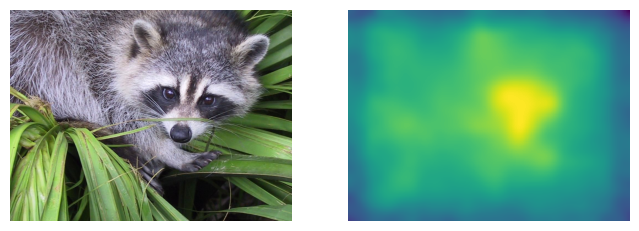

In [5]:
f, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 3))
axs[0].imshow(image)
axs[0].set_axis_off()

axs[1].matshow(log_density_prediction.detach().cpu().numpy()[0, 0])  # first image in batch, first (and only) channel
axs[1].set_axis_off()

In [6]:
log_density_prediction

tensor([[[[-19.4215, -19.4215, -19.4340,  ..., -23.7496, -23.7911, -23.7911],
          [-19.4215, -19.4215, -19.4340,  ..., -23.7496, -23.7911, -23.7911],
          [-19.4240, -19.4240, -19.4364,  ..., -23.7281, -23.7688, -23.7688],
          ...,
          [-21.1066, -21.1066, -21.1042,  ..., -20.6563, -20.6727, -20.6727],
          [-21.1329, -21.1329, -21.1303,  ..., -20.6492, -20.6657, -20.6657],
          [-21.1329, -21.1329, -21.1303,  ..., -20.6492, -20.6657, -20.6657]]]],
       dtype=torch.float64, grad_fn=<LogsumexpBackward0>)

In [7]:
print(image_tensor.shape)
print(image.shape)
print(log_density_prediction.shape)

torch.Size([1, 3, 768, 1024])
(768, 1024, 3)
torch.Size([1, 1, 768, 1024])


## Run DeepGaze on COCO examples

In [8]:
COCO_ROOT = '/gpfs01/bartels/user/hbhatnagar/coco/panoptic_annotations_trainval2017'
NSD_ROOT  = "/gpfs01/bartels/user/hbhatnagar/NSD_dataset/"
STIM_ROOT  = NSD_ROOT + "nsddata_stimuli/stimuli/nsd/"


stim_file = STIM_ROOT + "nsd_stimuli.hdf5"
exp_design_file = NSD_ROOT + "nsddata/experiments/nsd/nsd_expdesign.mat"
nsd_stiminfo_file = '/gpfs01/bartels/user/hbhatnagar/NSD_dataset/nsddata/experiments/nsd/nsd_stim_info_merged.pkl'


In [9]:
image_data_set = h5py.File(stim_file, 'r')

for key, value in image_data_set.items() :
    print(key,": \n", value,"\n")
    
image_data = np.copy(image_data_set['imgBrick'])
image_data_set.close()

imgBrick : 
 <HDF5 dataset "imgBrick": shape (73000, 425, 425, 3), type "|u1"> 



In [10]:
stiminfo = pd.read_pickle(nsd_stiminfo_file)

subject=1

image_data_set = h5py.File(STIM_ROOT + "S%d_stimuli_227.h5py"%subject, 'r') # For example - S01_stimuli_227.h5py
image_data = np.copy(image_data_set['stimuli'])
image_data_set.close()

print (image_data.shape) # Orig. 10,000 x 3 x 227 x 227
print (image_data.dtype)
print (np.min(image_data[0]), np.max(image_data[0]))

(10000, 3, 227, 227)
uint8
0 255


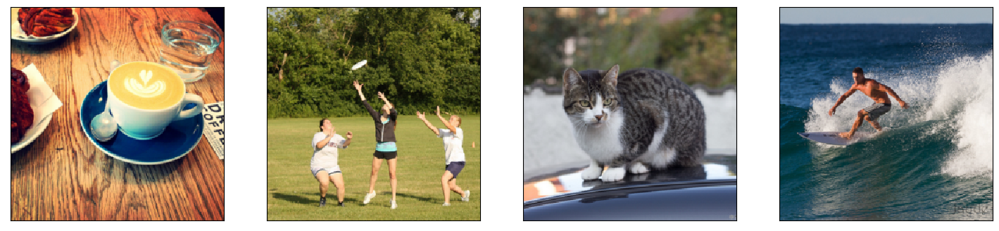

In [11]:
plt.figure(figsize=(18,6))

num_images = 4 
for i in range(num_images):
    plt.subplot(1,num_images,i+1)
    plt.imshow(image_data[6+i].transpose((1,2,0)), cmap='gray', interpolation='None')
    plt.gca().get_xaxis().set_visible(False)
    plt.gca().get_yaxis().set_visible(False)

In [12]:
# RUN ONLY IF MODEL HAS NOT BEEN INSTANTIATED BEFORE 
# DEVICE = 'cuda'
# model = deepgaze_pytorch.DeepGazeIIE(pretrained=True).to(DEVICE)

In [13]:
def gen_saliency(image,model,channel_loc = 0):
    '''
    Generate saliency map using DeepGaze 
    
    '''
    # if model == 'dg1':
    #     model = deepgaze_pytorch.DeepGazeI(pretrained=True).to(DEVICE)
    # elif model == 'dg2':
    #     model = deepgaze_pytorch.DeepGazeII(pretrained=True).to(DEVICE)
    # elif model == 'dg2e':
    #     model = deepgaze_pytorch.DeepGazeIIE(pretrained=True).to(DEVICE)
    # elif model == 'dg3':
    #     model = deepgaze_pytorch.DeepGazeIII(pretrained=True).to(DEVICE)
    
    model = model 

    centerbias_template = np.load('../src/DeepGaze/centerbias_mit1003.npy')
    
    # Here Image is supposed to be [H x W x C] 
    # But NSD images are [C x H x W] 
        
    if channel_loc == 0:
        centerbias = zoom(centerbias_template, (image.shape[1]/centerbias_template.shape[0], image.shape[2]/centerbias_template.shape[1]), order=0, mode='nearest')
        image_tensor = torch.tensor([image]).to(DEVICE)

    elif channel_loc == 2: 
        centerbias = zoom(centerbias_template, (image.shape[0]/centerbias_template.shape[0], image.shape[1]/centerbias_template.shape[1]), order=0, mode='nearest')
        image_tensor = torch.tensor([image.transpose(2, 0, 1)]).to(DEVICE) # for the face example

    centerbias -= logsumexp(centerbias)
    
    # create image tensor with H x W x C dimensions 
    
    # if the image is of the shape [W x H x C] --> H x W x C    
    centerbias_tensor = torch.tensor([centerbias]).to(DEVICE)
    log_density_prediction = model(image_tensor, centerbias_tensor)
    
    return log_density_prediction 

In [14]:
def plot_saliency(image, log_density_prediction, channel_loc = 0):
    '''
    Plot saliency maps using the log density prediction
    '''
    f, axs = plt.subplots(nrows=1, ncols=2, figsize=(20,6))
    if channel_loc == 0:
        axs[0].imshow(image.transpose((1,2,0)), cmap='gray', interpolation='None')
    elif channel_loc == 2:
         axs[0].imshow(image, cmap='gray', interpolation='None')
        
    axs[1].matshow(log_density_prediction.detach().cpu().numpy()[0, 0])
    axs[0].set_axis_off()
    axs[1].set_axis_off()

In [15]:
def gen_and_plot_saliency(model, image, channel_loc = 0):
    '''
    Combine generation and plotting of saliency maps in one function
    '''
    log_density_prediction = gen_saliency(image,model,channel_loc)
    plot_saliency(image, log_density_prediction, channel_loc)

In [16]:
def gen_and_save_saliency(model, image, channel_loc = 0):
    log_density_prediction = gen_saliency(image,model,channel_loc)
    save_saliency_map(log_density_prediction) 


(10000, 3, 227, 227)


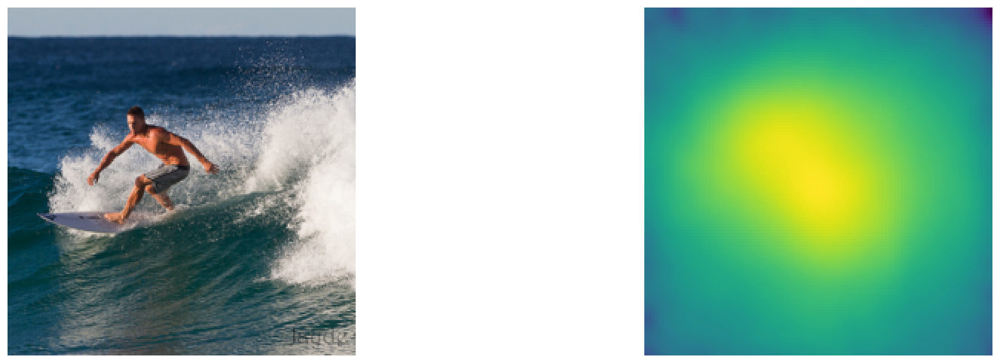

In [17]:
image = image_data[9]
print(image_data.shape)

gen_and_plot_saliency(model, image)

## Run on higher resolution images for better Saliency prediction

In [18]:
image_data_set = h5py.File(stim_file, 'r')

for key, value in image_data_set.items() :
    print(key,": \n", value,"\n")
    
image_data = np.copy(image_data_set['imgBrick'])
image_data_set.close()

imgBrick : 
 <HDF5 dataset "imgBrick": shape (73000, 425, 425, 3), type "|u1"> 



In [19]:
exp_design = loadmat(exp_design_file)
shared_idx   = exp_design['sharedix']
image_data[shared_idx[0,:]].shape

(1000, 425, 425, 3)

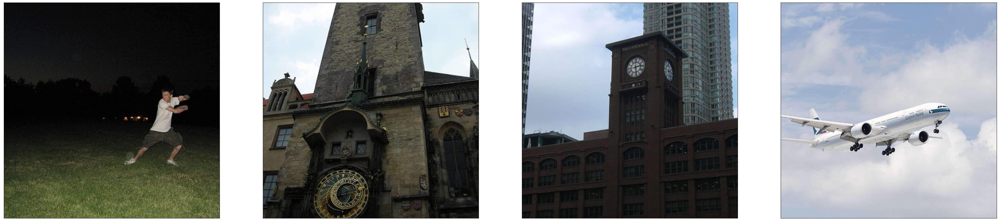

In [20]:
plt.figure(figsize=(50,20))
shared_images = image_data[shared_idx[0,:]]

for i in range(num_images):
    plt.subplot(1,num_images,i+1)
    
    plt.imshow(shared_images[5+i], cmap='gray', interpolation='None')
                        
    plt.gca().get_xaxis().set_visible(False)
    plt.gca().get_yaxis().set_visible(False)

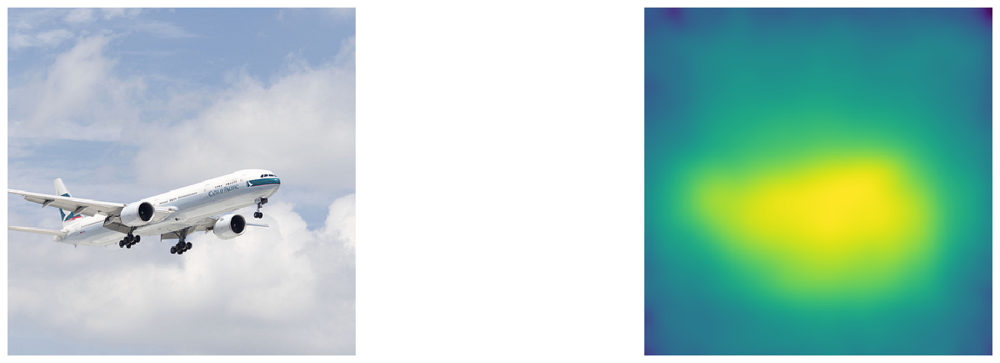

In [21]:
gen_and_plot_saliency(model, shared_images[8], channel_loc = 2 )

In [22]:
# def save_saliency_map(log_density_pred, path):
#     plt.matshow(log_density_prediction.detach().cpu().numpy()[0, 0])
#     plt.axis('off')
#     plt.savefig(path+'map.png')
#     plt.close()

In [23]:
# # Test saving saliency maps to disk
# SALIENCY_MAPS_PATH = '/gpfs01/bartels/user/hbhatnagar/nsd-static-saliency/results/saliency-maps'
# log_density_prediction = gen_saliency(shared_images[8],model,channel_loc = 2)
# save_saliency_map(log_density_prediction, SALIENCY_MAPS_PATH)

## Sanity check on the MIT1003 dataset

In [24]:
import glob
import cv2

In [25]:
# Images shown in the DeepGaze II paper were:

# MIT 1003 dataset: 
# Dog sign- i2254311605
# Lock in a book -i2265609722
# Graduation photo single face - i64011654
# Blurry photo of light trails - i1064999233
# 4 faces -  i114742201
# Car Dashboard - i125218174


mit1003_images_selected = []

selected_image_names = ['i2254311605.jpeg',
                        'i2265609722.jpeg',
                        'i64011654.jpeg',
                        'i1064999233.jpeg',
                        'i114742201.jpeg',
                        'i125218174.jpeg']

for file in glob.glob("/gpfs01/bartels/user/hbhatnagar/datasets/mit1003/ALLSTIMULI/*.jpeg"):
    if os.path.basename(file) in selected_image_names:
        # mit1003_images_selected.append(file)  
        # print(os.path.basename(file))
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mit1003_images_selected.append(img)
    

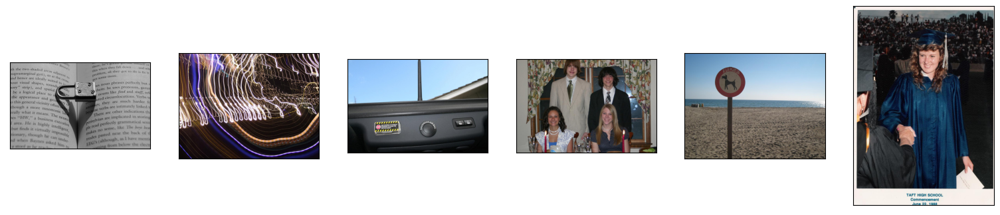

In [26]:
for i in range(0, len(mit1003_images_selected)):
    figure_size = plt.gcf().get_size_inches()
    factor = 1.2
    plt.gcf().set_size_inches(factor * figure_size) 
    plt.subplot(1,len(mit1003_images_selected),i+1)
    plt.imshow(mit1003_images_selected[i])
    
    plt.gca().get_xaxis().set_visible(False)
    plt.gca().get_yaxis().set_visible(False)

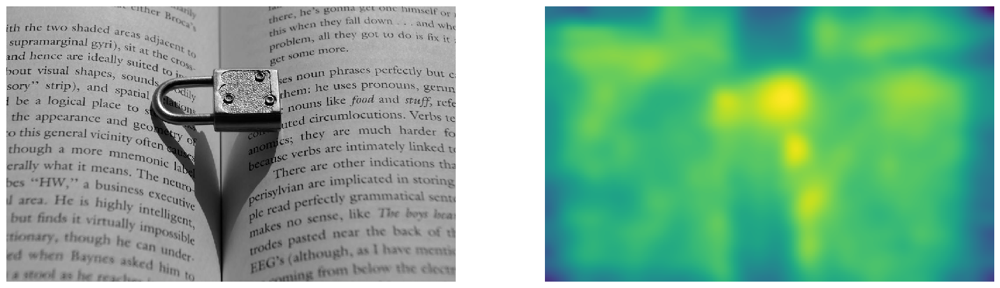

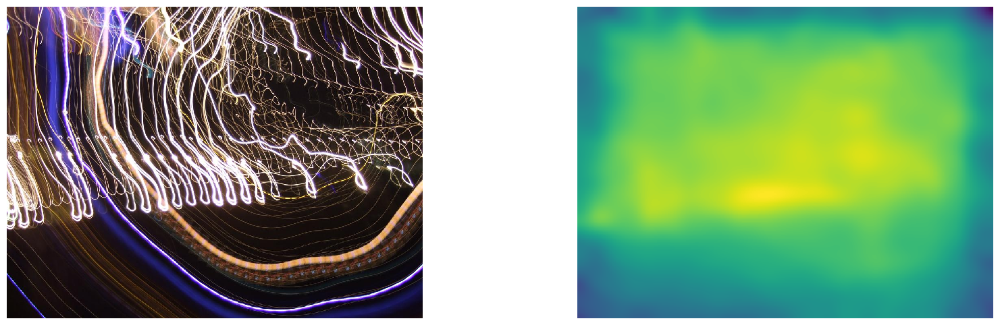

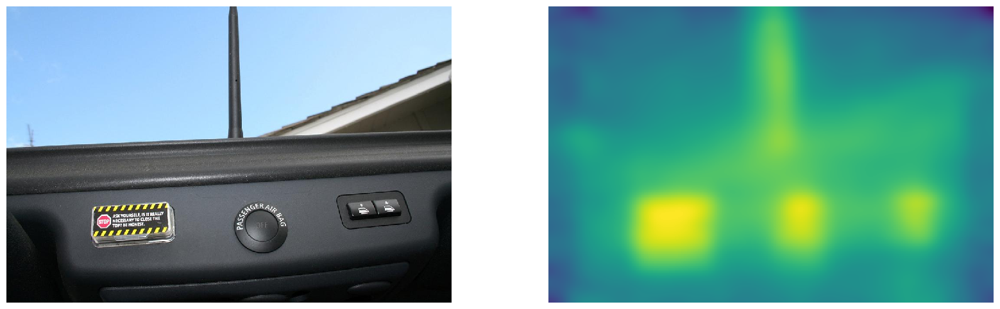

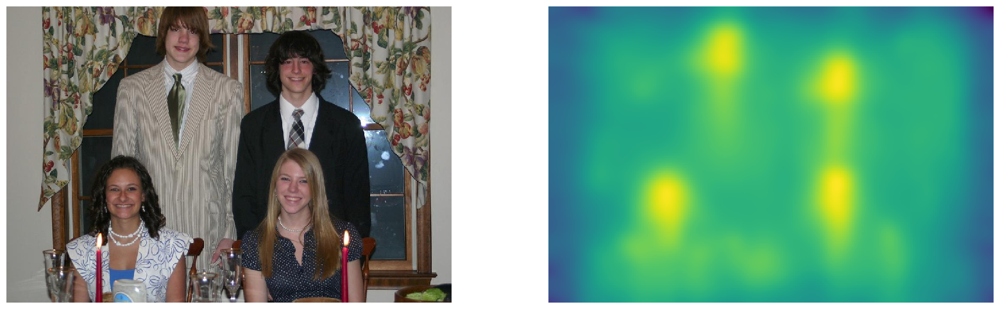

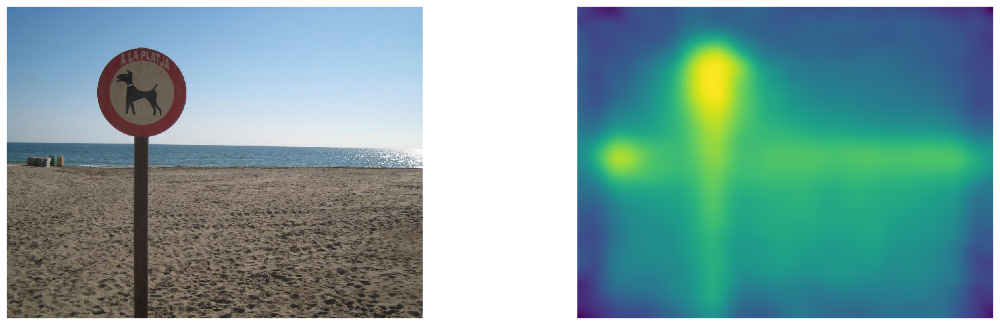

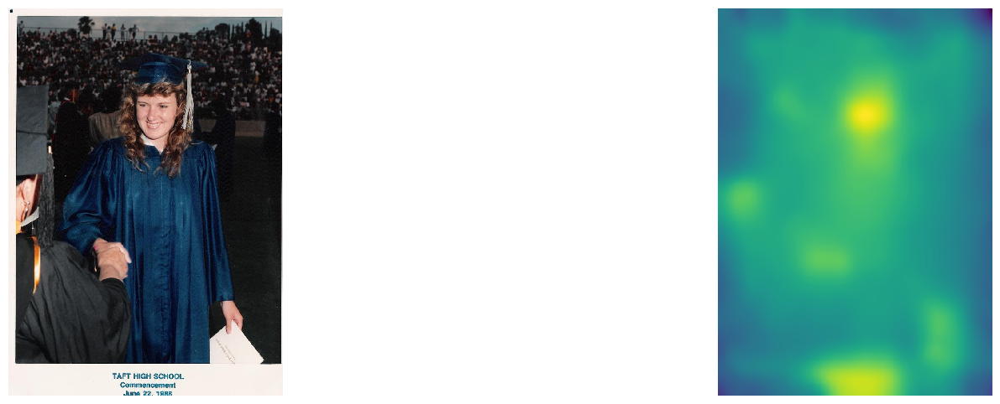

In [27]:
for i in range(0, len(mit1003_images_selected)):
    gen_and_plot_saliency(model, mit1003_images_selected[i], channel_loc = 2)

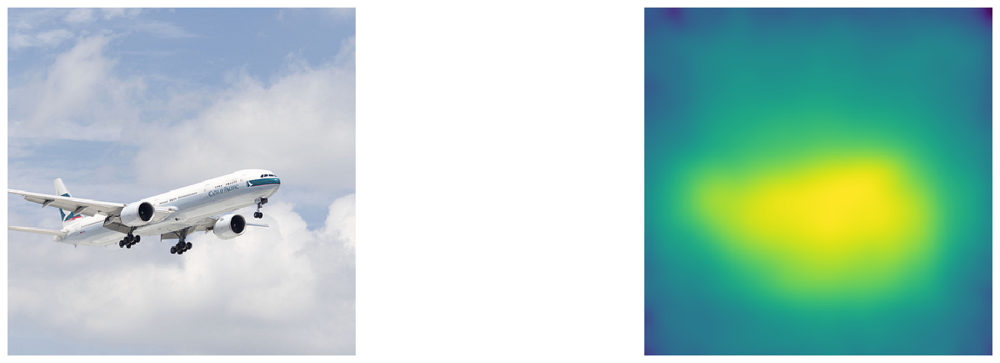

In [28]:
# save the saliency maps to a place  
gen_and_plot_saliency(model, shared_images[8], channel_loc = 2 )

## Scale up to generate saliency map for the entire NSD (COCO) dataset (shared images) 

In [29]:
shared_images = image_data[shared_idx[0,:]] # (1000, 425, 425, 3)

In [30]:
# TAKES ~30 MINUTES TO RUN

# 1. generate log density prediction for each image 
# 2. save to disk each prediction according the name of the image 


'''
num_images = 1000 # shared_images.shape[0]
log_density_prediction = []
for i in range(num_images): # run for all the images
    # print(i)
    image = shared_images[i]
    log_density_prediction.append(gen_saliency(image,model,channel_loc = 2).detach().numpy())
    # save to disk 

torch.save(log_density_prediction,'../data/log_density_predictions_%s_images.pt' %(num_images))
''' 


"\nnum_images = 1000 # shared_images.shape[0]\nlog_density_prediction = []\nfor i in range(num_images): # run for all the images\n    # print(i)\n    image = shared_images[i]\n    log_density_prediction.append(gen_saliency(image,model,channel_loc = 2).detach().numpy())\n    # save to disk \n\ntorch.save(log_density_prediction,'../data/log_density_predictions_%s_images.pt' %(num_images))\n"

In [31]:
# Test loading of tensor 
log_pred_loaded = torch.load('../data/log_density_predictions_1000_images.pt')
# log_pred_loaded[4].shape
len(log_pred_loaded)

1000

# Generate a scalar value for a "saliency score" for each of the images and rank them accordingly

## Disable the normalization step of DeepGaze to generate unnormalized log probabilities

In [32]:
from src.DeepGaze.deepgaze_pytorch.deepgaze2emod import DeepGazeIIE_mod

In [33]:
model_mod = DeepGazeIIE_mod(pretrained=True).to(DEVICE)

/gpfs01/bartels/user/hbhatnagar/anaconda3/envs/NSD-Saliency/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/gpfs01/bartels/user/hbhatnagar/anaconda3/envs/NSD-Saliency/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Loaded pretrained weights for efficientnet-b5


Using cache found in /gpfs01/bartels/user/hbhatnagar/.cache/torch/hub/pytorch_vision_v0.6.0
/gpfs01/bartels/user/hbhatnagar/anaconda3/envs/NSD-Saliency/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Using cache found in /gpfs01/bartels/user/hbhatnagar/.cache/torch/hub/pytorch_vision_v0.6.0
/gpfs01/bartels/user/hbhatnagar/anaconda3/envs/NSD-Saliency/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `we

In [34]:
image = face()

# load precomputed centerbias log density (from MIT1003) over a 1024x1024 image
# you can download the centerbias from https://github.com/matthias-k/DeepGaze/releases/download/v1.0.0/centerbias_mit1003.npy
# alternatively, you can use a uniform centerbias via `centerbias_template = np.zeros((1024, 1024))`.
centerbias_template = np.load('../src/DeepGaze/centerbias_mit1003.npy')
# rescale to match image size
centerbias = zoom(centerbias_template, (image.shape[0]/centerbias_template.shape[0], image.shape[1]/centerbias_template.shape[1]), order=0, mode='nearest')
# renormalize log density
centerbias -= logsumexp(centerbias)

image_tensor = torch.tensor([image.transpose(2, 0, 1)]).to(DEVICE)
centerbias_tensor = torch.tensor([centerbias]).to(DEVICE)

log_density_prediction_mod = model_mod(image_tensor, centerbias_tensor)

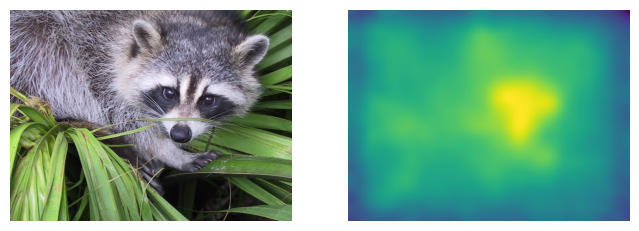

In [35]:
f, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 3))
axs[0].imshow(image)
axs[0].set_axis_off()

axs[1].matshow(log_density_prediction_mod.detach().cpu().numpy()[0, 0])  # first image in batch, first (and only) channel
axs[1].set_axis_off()

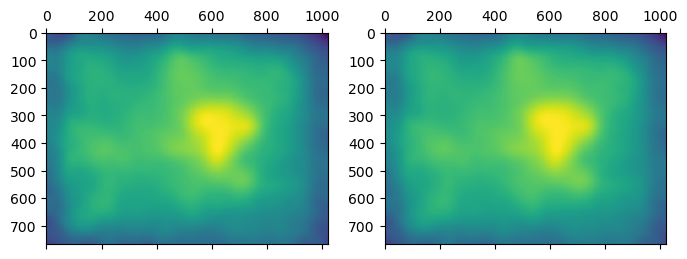

In [36]:
f, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 3))

axs[0].matshow(log_density_prediction_mod.detach().cpu().numpy()[0, 0]) 
axs[1].matshow(log_density_prediction.detach().cpu().numpy()[0, 0]) 

cax = axs[0].matshow(log_density_prediction_mod.detach().cpu().numpy()[0, 0]) 


## Compare two images and their before vs. after normalization saliency maps 


In [37]:
# compare two images 
# for each you create the original prediction after softmax and before softmax
# generates four images 
# plot all of them and keep the scaling constant across the four

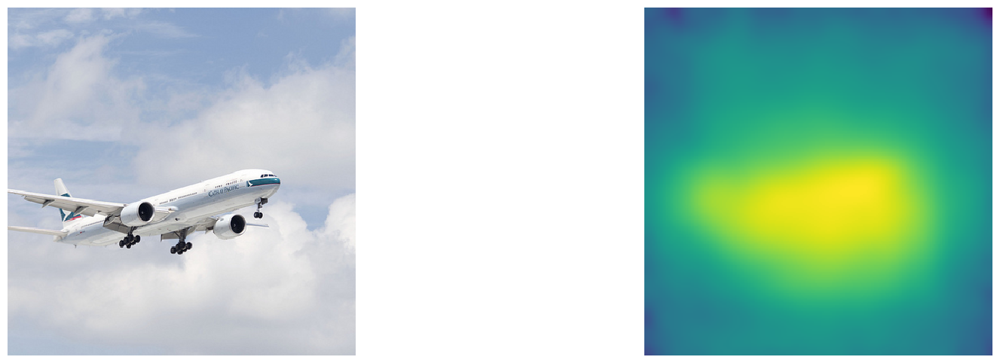

In [38]:
gen_and_plot_saliency(model_mod, shared_images[8], channel_loc = 2 )

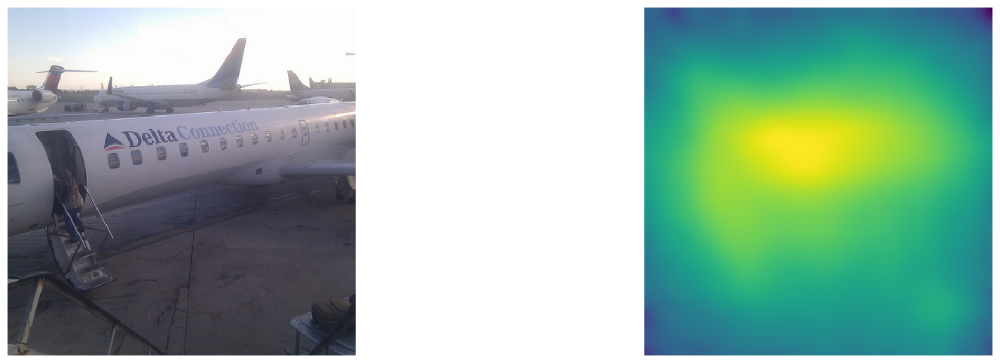

In [39]:
gen_and_plot_saliency(model_mod, shared_images[9], channel_loc = 2 )

In [40]:
# sanity checks 

# Probability scores (log scores) should integrate or sum to 1 across the image AFTER the normalization step 


# check the sum before and after the normalization step in deepgaze 

# take ALL of the images, and then take a point cloud/histogram next to histogram of the images just before normalization

# X- Y scatter plot - 
    # X: values in the original vesion *with norm
    # Y: without norm 
    

In [41]:
# Generate unnormalized log densities with the modified model and save it to disk

# TAKES 30 minutes to run 

# num_images = 1000 # shared_images.shape[0]
# log_density_prediction = []
# for i in range(num_images): # run for all the images
#     # print(i)
#     image = shared_images[i]
#     log_density_prediction.append(gen_saliency(image,model_mod,channel_loc = 2).detach().numpy())
#     # save to disk 

# torch.save(log_density_prediction,'../data/log_density_NO_NORM_predictions_%s_images.pt' %(num_images))


In [42]:
# load the loaded log densities for the all the coco images 
log_pred_loaded = torch.load('../data/log_density_predictions_1000_images.pt')
log_pred_no_norm_loaded = torch.load('../data/log_density_NO_NORM_predictions_1000_images.pt')

print(len(log_pred_loaded), len(log_pred_no_norm_loaded))


1000 1000


In [43]:
# Check for the integration of log densities before and after norm 
test_image = log_pred_loaded[0][0][0] # 425 x 425 
len_sum = test_image.sum(axis=None)
len_sum

-2568459.9550527763

In [44]:
def integrate_before_after_norm(preds_w_norm, preds_wo_norm):
    '''
    
    Integrate the two prediction matrices (before and after normalization has been applied) 
    
    Returns:
    Integrated two matrices 
    '''
    
    num_image = len(log_pred_loaded) # change to 1000 
    
    int_wo_norm = np.empty(num_image)
    int_w_norm = np.empty(num_image)
    
    # print(int_wo_norm.shape)
    
    for image_idx in range(num_image):
        # print(image_idx)
        int_w_norm[image_idx] = preds_w_norm[image_idx][0][0].sum(axis=None) # sum acros the whole matrix 
        int_wo_norm[image_idx] = preds_wo_norm[image_idx][0][0].sum(axis=None)
        
    return int_w_norm,int_wo_norm
        

In [45]:
int_w_norm,int_wo_norm = integrate_before_after_norm(log_pred_loaded,log_pred_no_norm_loaded )

In [46]:
# Scatterplot between int. values before and after the normalization step 
def plot_scatter_bw_norm_vals(val_before_norm, val_after_norm):

    fig, ax = plt.subplots()
    ax.scatter(val_before_norm,val_after_norm)

    ax.set_ylabel('With normalization')
    ax.set_xlabel('Without normalization')


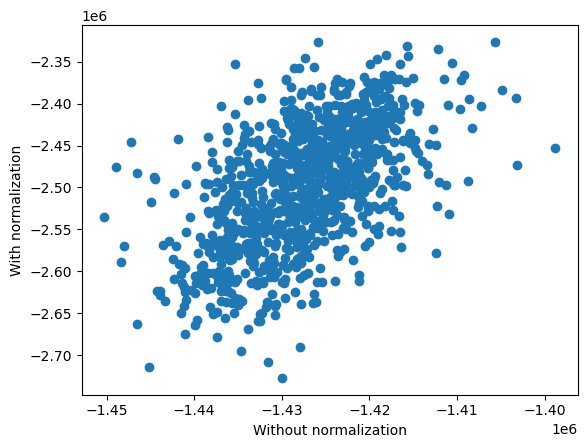

In [47]:
plot_scatter_bw_norm_vals(int_wo_norm,int_w_norm)

In [48]:
def plot_hist_bw_norm_vals(val_before_norm, val_after_norm, sharex,sharey):
    n_bins = 30
    fig, axs = plt.subplots(1, 2, sharey=sharey, sharex= sharex, tight_layout=True)
    axs[0].hist(val_after_norm, bins=n_bins)
    axs[1].hist(val_before_norm, bins=n_bins)
    axs[0].set_xlabel('With normalization')
    axs[1].set_xlabel('Without normalization')

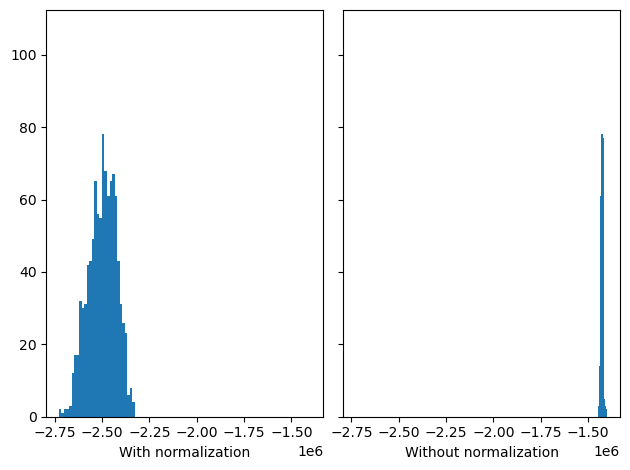

In [49]:
plot_hist_bw_norm_vals(int_wo_norm,int_w_norm, True,True)

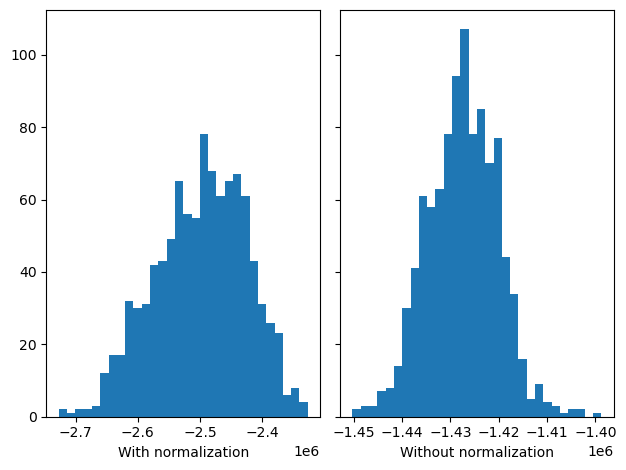

In [50]:
plot_hist_bw_norm_vals(int_wo_norm,int_w_norm, False,True)

In [51]:
# Undo the log transformation  and then do the integration 

# Use Deepgaze 2 instead of 2e
# Or even deepgaze 1 


# Compare saliency between DG 2/3/2e 

# Check the score with the stimuli 

In [52]:
# Undo log-transform (natural log) 
def undo_log_transform():
    
    num_image = len(log_pred_loaded) # change to 1000 
    
    exp_pred_wo_norm = []
    exp_pred_w_norm = []
            
    for image_idx in range(num_image):
        # print(image_idx)
        exp_pred_wo_norm.append(np.exp(log_pred_loaded[image_idx][0][0])) # index is image_idx
        exp_pred_w_norm.append(np.exp(log_pred_no_norm_loaded[image_idx][0][0]))
        
    return exp_pred_w_norm,exp_pred_wo_norm

In [53]:
exp_pred_w_norm,exp_pred_wo_norm = undo_log_transform()

In [54]:
# visualize in the same manner as before 

In [55]:
int_w_norm_EXP,int_wo_norm_EXP= integrate_before_after_norm(exp_pred_w_norm,exp_pred_wo_norm )

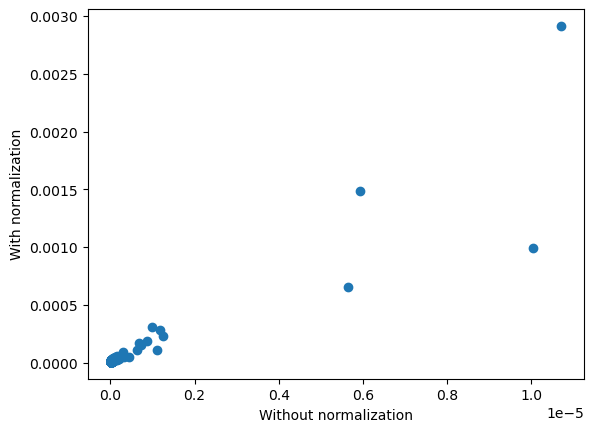

In [56]:
plot_scatter_bw_norm_vals(int_wo_norm_EXP,int_w_norm_EXP)

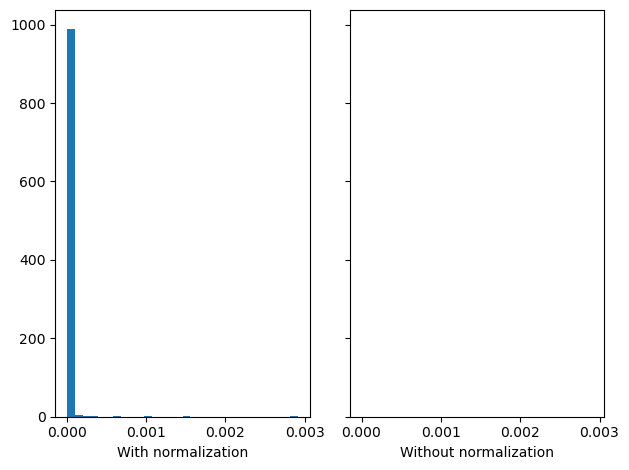

In [57]:
plot_hist_bw_norm_vals(int_wo_norm_EXP,int_w_norm_EXP, True,True)

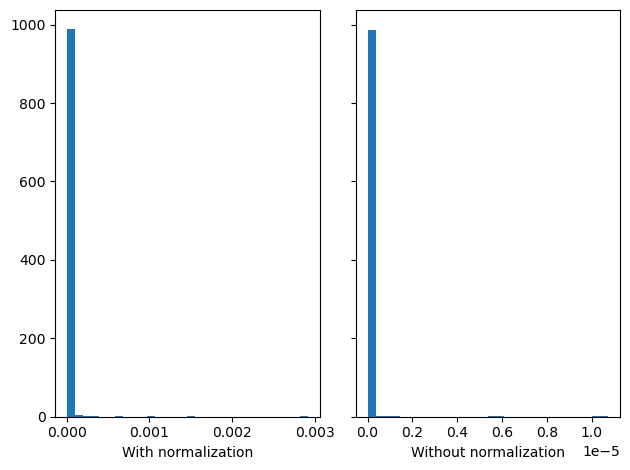

In [58]:
plot_hist_bw_norm_vals(int_wo_norm_EXP,int_w_norm_EXP, False,True)

## Compare DeepGaze variants  

In [59]:
def gen_pred_and_vis(model):
    
    
    # 1. Generate log-density-predicitons 
    num_images = 1000 # shared_images.shape[0]
    log_density_prediction = []


    for i in range(num_images): # run for all the images
        image = shared_images[i]
        log_density_prediction.append(gen_saliency(image,model,channel_loc = 2).detach().numpy())
        # save to disk 

    torch.save(log_density_prediction,'../data/log_density_%s_predictions_%s_images.pt' %(model,num_images))
    
    # 2. Visualize the predicitons before and after undoing the log-transform
    #

In [60]:
# DeepGaze 1 (apparently does not have last finalizer layer


In [61]:
# DeepGaze 3 (does have a finalizer layer, could disable the norm part there)

In [62]:
# TBC later 

### Visualize the distribution of the integrations and the corresponding images and their saliency maps 

In [63]:
# Integrations after normalizations 

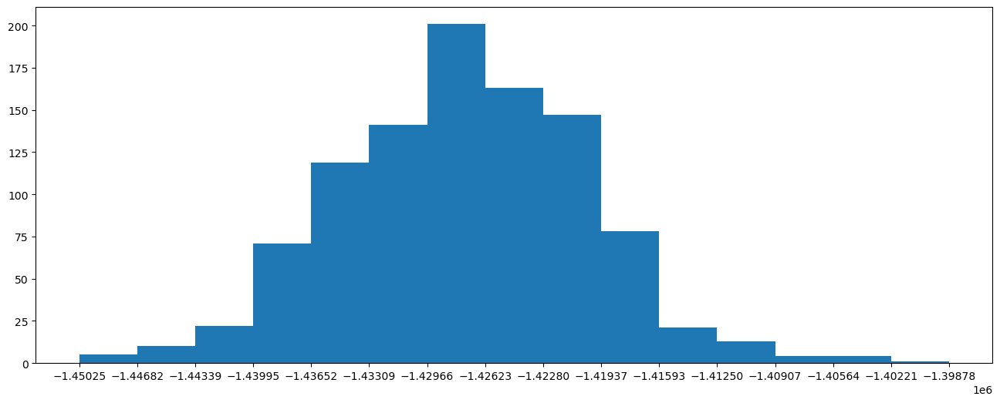

6


In [64]:
fig = plt.figure(figsize=(16,6))
n, bins, patches = plt.hist(int_wo_norm, bins = 15)
plt.xticks(bins)
plt.show()
elem = np.argmax(n)
print(elem)

In [65]:
print(bins)

[-1450249.69443943 -1446818.06887315 -1443386.44330687 -1439954.81774059
 -1436523.19217431 -1433091.56660803 -1429659.94104175 -1426228.31547547
 -1422796.68990919 -1419365.06434291 -1415933.43877663 -1412501.81321035
 -1409070.18764407 -1405638.56207779 -1402206.93651151 -1398775.31094523]


In [66]:
print(range(bins.shape[0]))

range(0, 16)


In [67]:
# Print the corresponding images form the histogram bins 

In [68]:
idx_ex = np.where(np.isclose(int_wo_norm, -1446818.06887315))
idx_ex
# print(idx_ex[0][0])

(array([], dtype=int64),)

In [69]:
int_wo_norm[idx_ex[0][0]]

IndexError: index 0 is out of bounds for axis 0 with size 0

In [70]:
def find_images_from_hist():
    '''
    Find the index of the n_bins images from the histogram and plot them along with their saliency maps
    '''
    list_idx = []
    
    # 1. Create ranges from the bins of the histogram 
    # 2. Corresponding to each bin, find one instance of an image (possibly the one with the max int. score) 
    # 3. Save the indices for these images in an array 
    
    
#     for n_bin in range(bins.shape[0]):
#         img_idx =  np.where(np.isclose(int_wo_norm, bins[n_bin]))
#         print(img_idx)
#         img_list.append(img_idx[0][0])

    for i in range(bins.shape[0]): 
        # 1. create ranges from the bins 
        j = i+1 
        
        if j >= bins.shape[0]: # Exit condition 
            return 
                
        int_min_range = bins[i]
        int_max_range = bins[j]
        
        # 2. find the index of an image from the range 
        
        print(i,j)
        print(int_min_range, int_max_range)
        
        img_idx =  np.where(np.logical_and(int_wo_norm>=int_min_range, int_wo_norm<=int_max_range))
        
        # this will result in multiple indices, we need to choose one from it 
        # for now just choose the 0th index (CHANGE LATER) 
        print(img_idx[0][0])
        # img_idx = img_idx
        
        list_idx.append(img_idx[0][0])
        print(list_idx) 
        
    return list_idx 

In [71]:
list_idx = find_images_from_hist()

0 1
-1450249.6944394284 -1446818.0688731486
47
[47]
1 2
-1446818.0688731486 -1443386.4433068687
62
[47, 62]
2 3
-1443386.4433068687 -1439954.817740589
36
[47, 62, 36]
3 4
-1439954.817740589 -1436523.192174309
0
[47, 62, 36, 0]
4 5
-1436523.192174309 -1433091.5666080292
4
[47, 62, 36, 0, 4]
5 6
-1433091.5666080292 -1429659.9410417492
2
[47, 62, 36, 0, 4, 2]
6 7
-1429659.9410417492 -1426228.3154754695
6
[47, 62, 36, 0, 4, 2, 6]
7 8
-1426228.3154754695 -1422796.6899091895
7
[47, 62, 36, 0, 4, 2, 6, 7]
8 9
-1422796.6899091895 -1419365.0643429097
15
[47, 62, 36, 0, 4, 2, 6, 7, 15]
9 10
-1419365.0643429097 -1415933.4387766297
1
[47, 62, 36, 0, 4, 2, 6, 7, 15, 1]
10 11
-1415933.4387766297 -1412501.81321035
78
[47, 62, 36, 0, 4, 2, 6, 7, 15, 1, 78]
11 12
-1412501.81321035 -1409070.18764407
70
[47, 62, 36, 0, 4, 2, 6, 7, 15, 1, 78, 70]
12 13
-1409070.18764407 -1405638.5620777903
35
[47, 62, 36, 0, 4, 2, 6, 7, 15, 1, 78, 70, 35]
13 14
-1405638.5620777903 -1402206.9365115103
74
[47, 62, 36, 0, 4,

In [72]:
list_idx

In [73]:
# Top 10 images and the botton 10 corresponding images 

def find_best_worst_imgs(int_arr, N=20):
    '''
    Find the best N and the worst N images as defined by the integration score 
    
    '''
    
    y = int_arr.copy() # <----optional, create a copy of the array
    y = np.sort(y) # sort array
    # y = y[::-1] # reverse sort order
    
    y_best = y[:N] # take a slice of the first N
    # print(y_best.shape)
    y_worst = y[-N:] 
    
    # print(y_worst.shape)
    # find the indices of the best/worst images
    int_max_list = []
    int_min_list = [] 
    
    for i in range(N):  # iterate over N and find the indices one by one 
        int_min_list.append(np.where(np.isclose(int_arr, y_worst[i]))) 
        int_max_list.append(np.where(np.isclose(int_arr, y_best[i] )))

    return int_max_list, int_min_list


In [74]:
# find the top 5 indices 
int_max_list, int_min_list = find_best_worst_imgs(int_wo_norm, N= 20)


print(int_max_list)
print(int_min_list)

[(array([268]),), (array([772]),), (array([47]),), (array([897]),), (array([467]),), (array([685]),), (array([590]),), (array([430]),), (array([62]),), (array([559]),), (array([446]),), (array([828]),), (array([115, 788]),), (array([115, 788]),), (array([982]),), (array([158]),), (array([404]),), (array([82]),), (array([469]),), (array([984]),)]
[(array([775]),), (array([231]),), (array([818]),), (array([645]),), (array([194]),), (array([208]),), (array([551]),), (array([633]),), (array([930]),), (array([413]),), (array([179]),), (array([820]),), (array([35]),), (array([711]),), (array([808]),), (array([987]),), (array([174]),), (array([427]),), (array([74]),), (array([377]),)]


In [75]:
def plot_best_worst_img(num_images_per):
    '''
    
    Plot imgs side by side 
    Left: Best images 
    Right: Worst images 
    
    Arg:
        num_images_per: number of images per column (best/worst)
        merged_list: list containing merged indices of the best and worst scoring images 
        
    Return:
        None

    '''
    
    # zip the indices such that it's a single linear index array 
    merged_idx_list = []

    for i in range(len(int_max_list)): 
        merged_idx_list.append(int_max_list[i][0][0])
        merged_idx_list.append(int_min_list[i][0][0])

    # print(merged_idx_list, len(merged_idx_list))
    
    fig = plt.figure(figsize=(8, 80))
    columns = 2
    rows = 20
    ax = []

    for i in range(columns*rows):

        img= shared_images[merged_idx_list[i]]
        ax.append( fig.add_subplot(rows, columns, i+1) )
        # ax[-1].set_title("ax:"+str(i))  # set title
        ax[i].set_axis_off()
        plt.imshow(img, cmap='gray', interpolation='None')

    ax[0].set_title("Best images")
    ax[1].set_title("Worst images")

    plt.show()

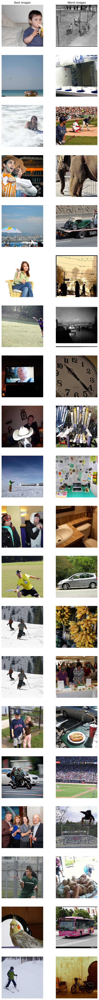

In [76]:
plot_best_worst_img(len(int_max_list)) 

In [77]:
# int_min , int_max = np.min(int_wo_norm), np.max(int_wo_norm)
# img_idx_min, img_idx_max  =  np.where(np.isclose(int_wo_norm, int_min)),  np.where(np.isclose(int_wo_norm,int_max))
# print(img_idx_min, img_idx_max)

In [78]:
# gen_and_plot_saliency(model_mod , shared_images[img_idx_min[0][0]], channel_loc = 2)

In [79]:
# gen_and_plot_saliency(model_mod , shared_images[img_idx_max[0][0]], channel_loc = 2)

In [80]:
# calculate the correlation coeffiecient before and after normalization (rank correlation) 
#print(model)


In [81]:
# Activation hooks 

In [82]:
model_DG1= deepgaze_pytorch.DeepGazeI(pretrained=True).to(DEVICE)
print(model_DG1)

Using cache found in /gpfs01/bartels/user/hbhatnagar/.cache/torch/hub/pytorch_vision_v0.6.0
/gpfs01/bartels/user/hbhatnagar/anaconda3/envs/NSD-Saliency/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DeepGazeI(
  (features): FeatureExtractor(
    (features): RGBalexnet(
      (0): Normalizer()
      (1): AlexNet(
        (features): Sequential(
          (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
          (1): ReLU(inplace=True)
          (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
          (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
          (4): ReLU(inplace=True)
          (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
          (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (7): ReLU(inplace=True)
          (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (9): ReLU(inplace=True)
          (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (11): ReLU(inplace=True)
          (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=Fals

In [83]:
# The layer we are interested in: 

model_DG1.readout_network.conv0

Conv2d(256, 1, kernel_size=(1, 1), stride=(1, 1), bias=False)

In [89]:
# Template for the activation hook 

act = {}
def getActivation(name):
    # the hook signature
    def hook(model, input, output):
        act[name] = output.detach()
    return hook

h = model_DG1.readout_network.conv0.register_forward_hook(getActivation('conv0'))

# Generate prediction
den_pred= model_DG1(image_tensor, centerbias_tensor)

print(act, act['conv0'].shape)

h.remove()



{'conv0': tensor([[[[-1.8328, -1.8328, -1.8328,  ...,  0.8186,  0.8186,  0.8186],
          [-1.8328, -1.8328, -1.8328,  ...,  0.8186,  0.8186,  0.8186],
          [-1.8328, -1.8328, -1.8328,  ...,  0.8186,  0.8186,  0.8186],
          ...,
          [-0.2284, -0.2284, -0.2284,  ...,  0.9917,  0.9917,  0.9917],
          [-0.2284, -0.2284, -0.2284,  ...,  0.9917,  0.9917,  0.9917],
          [-0.2284, -0.2284, -0.2284,  ...,  0.9917,  0.9917,  0.9917]]]])} torch.Size([1, 1, 96, 128])


In [ ]:
# Compare on COCO images now , similar to previous analysis 

In [91]:
# Redefine the function and clear the activation list 

activations = {}
def getActivation(name):
    # the hook signature
    def hook(model, input, output):
        activations[name] = output.detach()
    return hook

In [106]:
# Generate unnormalized log densities with the modified model and save it to disk


def generate_preds_hooks( model, num_images):
    
    unnorm_pred = []
    norm_pred = [] 
    # activations = {}
    
    # For DeepGaze 1 
    h = model.readout_network.conv0.register_forward_hook(getActivation('conv0'))
    centerbias_template = np.load('../src/DeepGaze/centerbias_mit1003.npy')

    
    for i in range(num_images): # run for all the images

        image = shared_images[i]
        centerbias = zoom(centerbias_template, (image.shape[0]/centerbias_template.shape[0], image.shape[1]/centerbias_template.shape[1]), order=0, mode='nearest')
        image_tensor = torch.tensor([image.transpose(2, 0, 1)]).to(DEVICE) # for the face example
        centerbias -= logsumexp(centerbias)
        centerbias_tensor = torch.tensor([centerbias]).to(DEVICE)
        log_density_prediction = model(image_tensor, centerbias_tensor)
        
        
        # log_density_prediction.append(gen_saliency(image,model,channel_loc = 2).detach().numpy())
        norm_pred.append(log_density_prediction.detach().numpy())
        # print(activations)
        unnorm_pred.append(activations['conv0'])
       

    # save to disk 
    torch.save(norm_pred,'../data/NORM_predictions_%s_images_DG1.pt' %(num_images))
    torch.save(unnorm_pred,'../data/NO_NORM_predictions_%s_images_DG1.pt' %(num_images))
    h.remove()
    
    
    return


In [107]:
# TAKES 5 minutes to run 
# generate_preds_hooks(model_DG1,1000)

In [108]:
# load the loaded log densities for the all the coco images 
log_pred_DG1_NO_NORM = torch.load('../data/NO_NORM_predictions_1000_images_DG1.pt')
log_pred_DG1_NORM = torch.load('../data/NORM_predictions_1000_images_DG1.pt')
print(len(log_pred_DG1_NO_NORM),len(log_pred_DG1_NORM))


1000 1000


In [110]:
print(log_pred_DG1_NORM[0].shape)

print(log_pred_DG1_NO_NORM[0].shape)

(1, 425, 425)
torch.Size([1, 1, 54, 54])


In [ ]:
# TODO for later 
# Memnet
# Abstract the NSD images in a torch dataloader format for ease of loading and unloading the data 